# Loading Graph

This notebook takes a dataset from a file or (Geo)DataFrame as well as graphs of processed flights and visualises the graph, as well as checking individual flights or handovers to extract a confidence value.

Before using this notebook ensure you have dumped some flight data using `demo-export-flights.ipynb` and processed them using `demo-process-flights.ipynb`.

In [1]:
from flight_processing import DataConfig
from flight_processing.data import AirspaceGraph, FlightDownloader

import geopandas
from datetime import datetime, timedelta
from dateutil import parser
import logging

logger = logging.getLogger()
logger.setLevel(level=logging.INFO)

logging.getLogger('traffic').disabled = True

## Example 1: known dataset from file, graph output in standard location

This example loads data from the expected location as defined in `~/.config/flight_processing/flight_processing.conf`.

In [2]:
airspacegraph = AirspaceGraph("switzerland")
airspacegraph.load_graphs("2020-03-05 00:00", "2020-04-24 00:00")

INFO:flight_processing.data.airspace_graph:Loading airspace dataset from disk at location /mnt/cold_data/josh/processing/regions_switzerland_wkt.json.
INFO:flight_processing.data.airspace_graph:Initialising AirspaceHandler C++ object.
INFO:flight_processing.data.airspace_graph:Successfully loaded airspaces, 152 in total.
INFO:flight_processing.data.airspace_graph:Loading matrix of handovers.
INFO:flight_processing.data.airspace_graph:Loading 1200 saved NPZ files, from 2020-03-05 00:00:00 to 2020-04-24 00:00:00.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200305/0000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200305/0100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200305/0200.npz.
INFO:flight_processing.data.airspace_graph:Lo

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200307/0500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200307/0600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200307/0700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200307/0800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200307/0900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200307/1000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200309/1400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200309/1500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200309/1600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200309/1700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200309/1800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200309/1900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200311/2300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200312/0000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200312/0100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200312/0200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200312/0300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200312/0400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200314/0800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200314/0900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200314/1000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200314/1100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200314/1200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200314/1300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200316/1700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200316/1800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200316/1900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200316/2000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200316/2100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200316/2200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200319/0200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200319/0300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200319/0400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200319/0500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200319/0600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200319/0700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200321/1100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200321/1200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200321/1300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200321/1400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200321/1500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200321/1600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200323/2000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200323/2100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200323/2200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200323/2300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200324/0000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200324/0100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200326/0500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200326/0600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200326/0700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200326/0800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200326/0900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200326/1000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200328/1400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200328/1500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200328/1600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200328/1700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200328/1800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200328/1900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200330/2300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200331/0000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200331/0100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200331/0200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200331/0300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200331/0400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200402/0800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200402/0900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200402/1000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200402/1100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200402/1200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200402/1300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200404/1700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200404/1800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200404/1900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200404/2000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200404/2100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200404/2200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200407/0200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200407/0300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200407/0400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200407/0500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200407/0600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200407/0700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200409/1100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200409/1200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200409/1300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200409/1400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200409/1500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200409/1600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200411/2000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200411/2100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200411/2200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200411/2300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200412/0000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200412/0100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200414/0500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200414/0600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200414/0700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200414/0800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200414/0900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200414/1000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200416/1400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200416/1500.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200416/1600.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200416/1700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200416/1800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200416/1900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200418/2300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200419/0000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200419/0100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200419/0200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200419/0300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200419/0400.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200421/0800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200421/0900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200421/1000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200421/1100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200421/1200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200421/1300.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200423/1700.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200423/1800.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200423/1900.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200423/2000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200423/2100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland/20200423/2200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerla

In [3]:
airspacegraph.visualise_graph()

INFO:flight_processing.data.airspace_graph:Drawing graph using holoviews.


:Graph   [start,end]   (weight,weight_adjusted)

INFO:flight_processing.data.airspace_graph:Downloading terrain data from Stamen.
INFO:flight_processing.data.airspace_graph:Plotting airspace boundaries on map.
INFO:flight_processing.data.airspace_graph:Extracting edge weights from graph.
INFO:flight_processing.data.airspace_graph:Plotting graph on map.


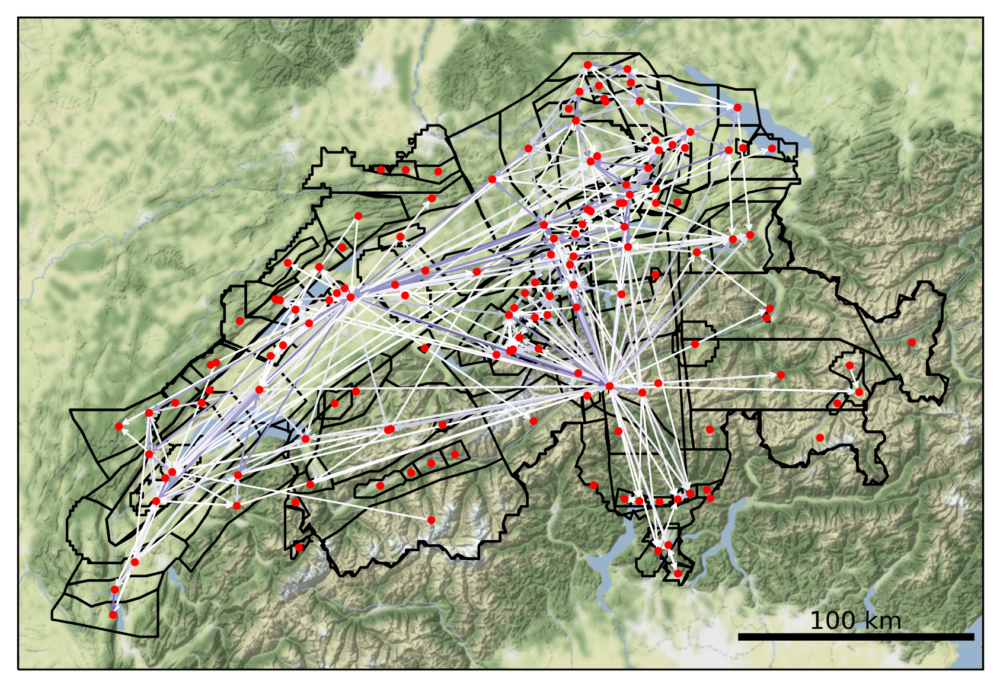

In [4]:
airspacegraph.draw_graph_map(logscale=True)

In [5]:
# Cleanup
del airspacegraph

## Example 2: known dataset from file, custom graph location

We're doing the same sort of thing as example 1, but calling `load_graph_files` instead of `load_graphs`, which allows us to input a custom file location instead of time bounds.

In [6]:
template = "/mnt/cold_data/josh/processing/graphs/switzerland/{date}/{time}.npz"
template_date = "%Y%m%d"
template_time = "%H%M"

start_time = parser.parse("2020-03-05 00:00")
time_delta = timedelta(hours=2)
count = 50 * 12

files = []

for i in range(count):
    time = start_time + (i * time_delta)
    file = template.format(
        date = time.strftime(template_date),
        time = time.strftime(template_time)
    )
    files.append(file)

airspacegraph = AirspaceGraph("switzerland")
airspacegraph.load_graph_files(files)

INFO:flight_processing.data.airspace_graph:Loading airspace dataset from disk at location /mnt/cold_data/josh/processing/regions_switzerland_wkt.json.
INFO:flight_processing.data.airspace_graph:Initialising AirspaceHandler C++ object.
INFO:flight_processing.data.airspace_graph:Successfully loaded airspaces, 152 in total.
INFO:flight_processing.data.airspace_graph:Loading matrix of handovers.
INFO:flight_processing.data.airspace_graph:Building graph from matrix.
INFO:flight_processing.data.data_utils:Generating new graph from dataframe.
INFO:flight_processing.data.airspace_graph:Computing adjusted weights.


In [7]:
airspacegraph.visualise_graph()

INFO:flight_processing.data.airspace_graph:Drawing graph using holoviews.


:Graph   [start,end]   (weight,weight_adjusted)

INFO:flight_processing.data.airspace_graph:Downloading terrain data from Stamen.
INFO:flight_processing.data.airspace_graph:Plotting airspace boundaries on map.
INFO:flight_processing.data.airspace_graph:Extracting edge weights from graph.
INFO:flight_processing.data.airspace_graph:Plotting graph on map.


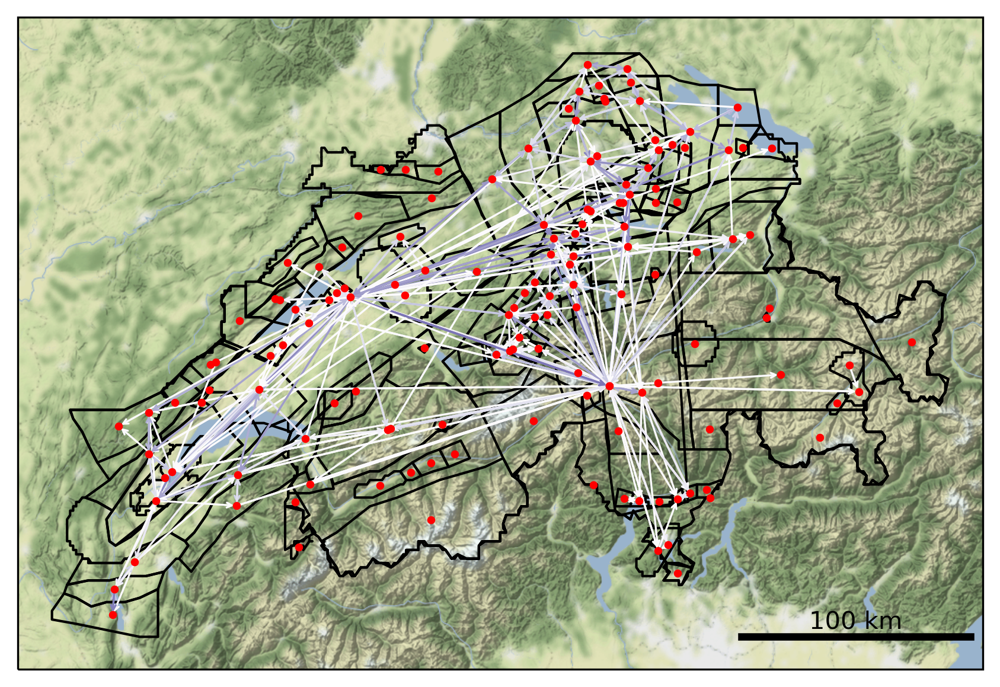

In [8]:
airspacegraph.draw_graph_map(logscale=True)

In [9]:
# Cleanup
del airspacegraph

## Example 3: Custom dataset, graph output in standard location

In this example we use a custom DataConfig as in example 2 of `demo-export-flights.ipynb` and `demo-process-flights.ipynb`. We also specify a custom dataset location.

In [10]:
dataset = DataConfig("switzerland-custom", minlon=5.3, maxlon=10.7, minlat=45.5, maxlat=48, detail=6)
location = "/mnt/cold_data/josh/processing/regions_switzerland_wkt.json"
airspacegraph = AirspaceGraph(dataset, dataset_location=location)

airspacegraph.load_graphs("2020-03-05 00:00", "2020-03-06 00:00")

INFO:flight_processing.data.airspace_graph:Loading airspace dataset from disk at location /mnt/cold_data/josh/processing/regions_switzerland_wkt.json.
INFO:flight_processing.data.airspace_graph:Initialising AirspaceHandler C++ object.
INFO:flight_processing.data.airspace_graph:Successfully loaded airspaces, 152 in total.
INFO:flight_processing.data.airspace_graph:Loading matrix of handovers.
INFO:flight_processing.data.airspace_graph:Loading 24 saved NPZ files, from 2020-03-05 00:00:00 to 2020-03-06 00:00:00.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland-custom/20200305/0000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland-custom/20200305/0100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/switzerland-custom/20200305/0200.npz.
INFO:flight_processing.dat

In [11]:
airspacegraph.visualise_graph()

INFO:flight_processing.data.airspace_graph:Drawing graph using holoviews.


:Graph   [start,end]   (weight,weight_adjusted)

INFO:flight_processing.data.airspace_graph:Downloading terrain data from Stamen.
INFO:flight_processing.data.airspace_graph:Plotting airspace boundaries on map.
INFO:flight_processing.data.airspace_graph:Extracting edge weights from graph.
INFO:flight_processing.data.airspace_graph:Plotting graph on map.


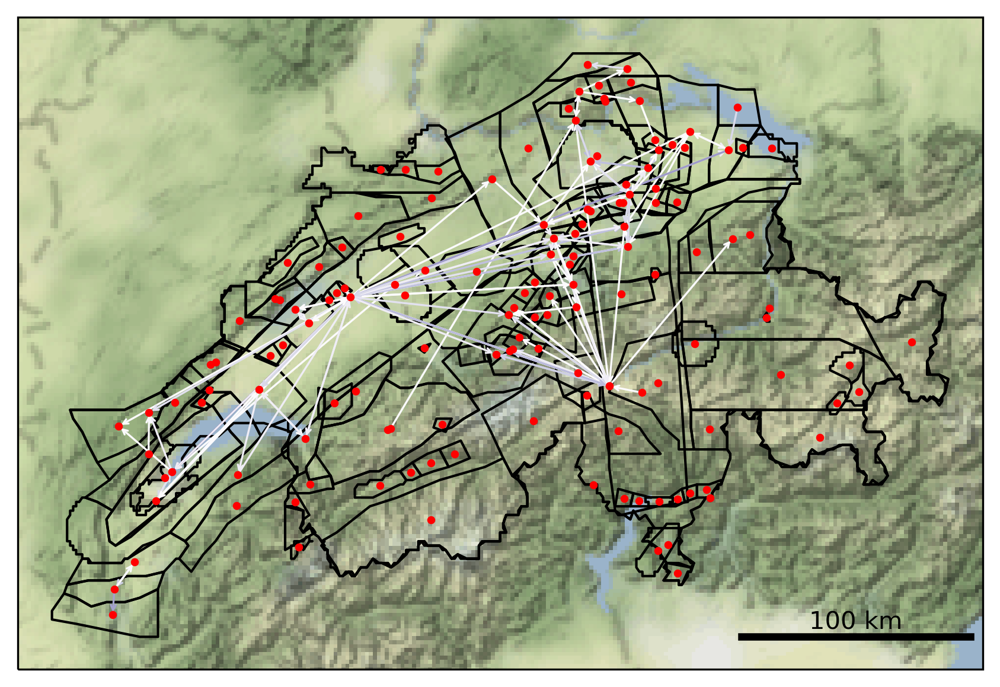

In [12]:
airspacegraph.draw_graph_map(logscale=True)

In [13]:
# Cleanup
del airspacegraph

## Example 4: Processing handovers and flights

In this example we load our graph and use it to obtain a confidence rating at a given point and for a given handover. We also do the same for all the potential handovers on a given flight.

We are using the UK dataset here - dump and process some flights for this dataset if you have not already done so.

In [14]:
airspacegraph = AirspaceGraph("uk")
airspacegraph.load_graphs("2020-01-01 00:00", "2020-01-02 00:00")

downloader = FlightDownloader("uk")

INFO:flight_processing.data.airspace_graph:Loading airspace dataset from disk at location /mnt/cold_data/josh/processing/regions_uk_wkt.json.
INFO:flight_processing.data.airspace_graph:Initialising AirspaceHandler C++ object.
INFO:flight_processing.data.airspace_graph:Successfully loaded airspaces, 616 in total.
INFO:flight_processing.data.airspace_graph:Loading matrix of handovers.
INFO:flight_processing.data.airspace_graph:Loading 24 saved NPZ files, from 2020-01-01 00:00:00 to 2020-01-02 00:00:00.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/uk/20200101/0000.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/uk/20200101/0100.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/cold_data/josh/processing/graphs/uk/20200101/0200.npz.
INFO:flight_processing.data.airspace_graph:Loading saved graph from location /mnt/c

INFO:flight_processing.data.airspace_graph:Downloading terrain data from Stamen.
INFO:flight_processing.data.airspace_graph:Plotting airspace boundaries on map.
INFO:flight_processing.data.airspace_graph:Extracting edge weights from graph.
INFO:flight_processing.data.airspace_graph:Plotting graph on map.


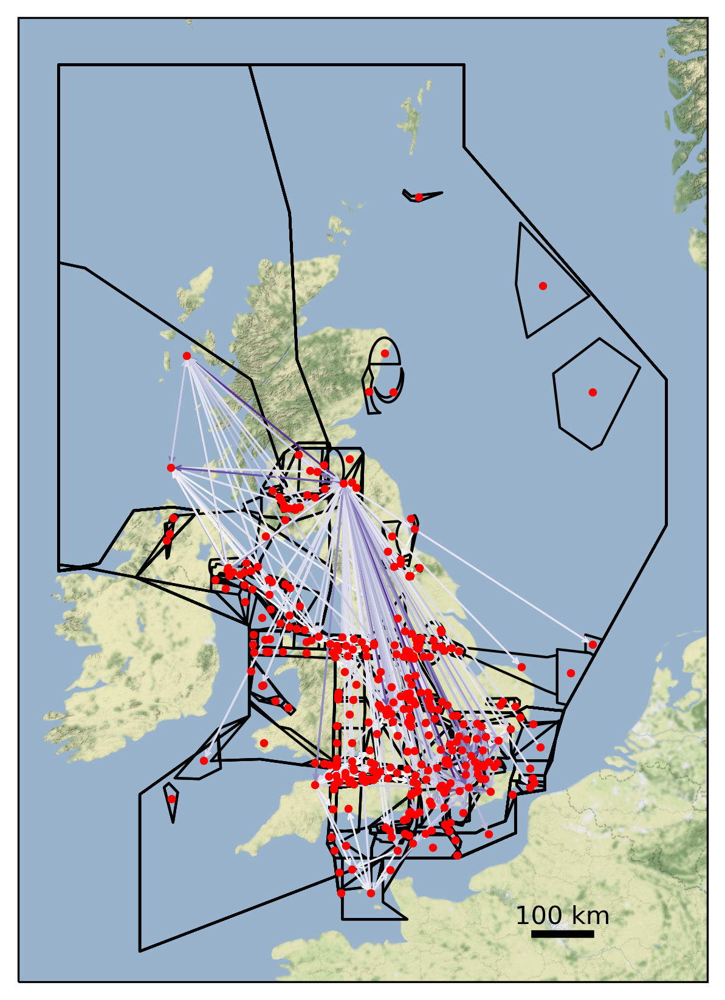

In [15]:
airspacegraph.draw_graph_map(logscale=True)

### Setup

First we need to (optionally) set the values and weights used for the functions that follow.

In [16]:
average_weight = airspacegraph.average_edge_weight(median=True)
print("Median edge weight: {}".format(average_weight))

airspacegraph.set_confidence_values(
    distance_zero = 5000,
    distance_one = 3000,
    minimum_weight = average_weight,
    minimum_weight_adjusted = 0.05,
    confidence_distance = 1.0,
    confidence_distance_modifier = 0.8,
    confidence_weight = 1.0,
    confidence_weight_adjusted = 1.0
)

INFO:flight_processing.data.airspace_graph:Computing median edge weight in graph.


Median edge weight: 24


### Test a single point

Next we can test a point - for each airspace contained within the point we are given a number of nearby airspaces, and information on the confidence of that potential handover.

In [17]:
long = -0.453350
lat = 51.470569
alt = 6000
airspacegraph.test_point(long, lat, alt)

INFO:flight_processing.data.airspace_graph:Getting airspaces at the given point using AirspaceHandler C++ object.
INFO:flight_processing.data.airspace_graph:Getting airspaces near to the given point using AirspaceHandler C++ object.
INFO:flight_processing.data.airspace_graph:Computing confidence in a handover to each nearby airspace.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.air

INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
I

INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airs

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.dat

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence ba

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence bas

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computin

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence bas

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
IN

[{'distance1': 0.0,
  'distance2': 869.841552734375,
  'confidence': 1.0,
  'weight': 0,
  'weight_adjusted': 0,
  'confidence_distance': 1.0,
  'confidence_weight': 0.0,
  'confidence_weight_adjusted': 0.0,
  'airspace1': 506,
  'airspace2': 264,
  'name1': 'LONDON TMA 3',
  'name2': 'LONDON LUTON CTA 4'},
 {'distance1': 0.0,
  'distance2': 869.841552734375,
  'confidence': 1.0,
  'weight': 0,
  'weight_adjusted': 0,
  'confidence_distance': 1.0,
  'confidence_weight': 0.0,
  'confidence_weight_adjusted': 0.0,
  'airspace1': 506,
  'airspace2': 262,
  'name1': 'LONDON TMA 3',
  'name2': 'LONDON LUTON CTA 4'},
 {'distance1': 0.0,
  'distance2': 869.841552734375,
  'confidence': 1.0,
  'weight': 0,
  'weight_adjusted': 0,
  'confidence_distance': 1.0,
  'confidence_weight': 0.0,
  'confidence_weight_adjusted': 0.0,
  'airspace1': 506,
  'airspace2': 263,
  'name1': 'LONDON TMA 3',
  'name2': 'LONDON LUTON CTA 4'},
 {'distance1': 0.0,
  'distance2': 6929.1259765625,
  'confidence': 1.0,


### Look at a single airspace

We can get information about a specific airspace:

In [18]:
a1 = "LONDON TMA 3"

airspacegraph.get_airspace(a1)

name                                                      LONDON TMA 3
lateral_limits       514021N 0004916W -514542N 0005550W -515021N 00...
upper_limit                                                      19500
lower_limit                                                       3500
class_of_airspace                                                    A
unit                                         LONDON CONTROL (SWANWICK)
callsign                                                LONDON CONTROL
language                                                       English
hours                                                              H24
frequency                                                      118.825
purpose                                                           None
remarks              Parts of the following ATS Routes are incorpor...
wkt                  MULTIPOLYGON (((-0.4916 51.4021, -0.555 51.454...
geometry             (POLYGON ((-0.4916 51.4021, -0.555 51.4542, -0...
total_

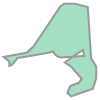

In [19]:
airspacegraph.get_airspace(a1).geometry

In [20]:
airspacegraph.graph["LONDON TMA 3"]

AtlasView({'LONDON STANSTED CTA 1': {'weight': 1960, 'weight_adjusted': 0.04219590958019376}, 'SOUTHERN CTA': {'weight': 19350, 'weight_adjusted': 0.41657696447793324}, 'UPPER AIRSPACE CTA': {'weight': 4620, 'weight_adjusted': 0.09946178686759957}, 'LONDON TMA 1': {'weight': 17100, 'weight_adjusted': 0.3681377825618945}, 'LONDON TMA 5': {'weight': 220, 'weight_adjusted': 0.004736275565123789}, 'LONDON TMA 6': {'weight': 1000, 'weight_adjusted': 0.021528525296017224}, 'LONDON TMA 7': {'weight': 910, 'weight_adjusted': 0.019590958019375673}, 'LONDON TMA 9': {'weight': 160, 'weight_adjusted': 0.003444564047362756}, 'LONDON TMA 16': {'weight': 650, 'weight_adjusted': 0.013993541442411194}, 'LONDON TMA 18': {'weight': 200, 'weight_adjusted': 0.004305705059203444}, 'LONDON TMA 19': {'weight': 280, 'weight_adjusted': 0.0060279870828848225}})

### Test a handover

Given two airspaces, we can get information on the confidence of a handover between those two airspaces at a given position:

In [21]:
a2 = "LONDON TMA 19"

airspacegraph.test_handover(long, lat, alt, a1, a2)

INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on distance from airspace borders.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.


{'distance1': 0.0,
 'distance2': 6929.1259765625,
 'confidence': 1.0,
 'weight': 280,
 'weight_adjusted': 0.0060279870828848225,
 'confidence_distance': 0.0,
 'confidence_weight': 1.0,
 'confidence_weight_adjusted': 0.0}

### Test a flight

Finally, we can test an entire flight, giving us a list of airspace handovers which could have occurred along the flight and the model's confidence in that handover.

In [22]:
# Download some flights
flights = downloader.download_flights("2019-01-01 00:00", "2019-01-01 01:00")
flights

INFO:flight_processing.data.flight_downloader:Downloading flights between 2019-01-01 00:00:00 and 2019-01-01 01:00:00 from OpenSky.
INFO:root:Sending request between time 2019-01-01 00:00:00+00:00 and 2019-01-01 01:00:00+00:00 and hour 2019-01-01 00:00:00+00:00 and 2019-01-01 01:00:00+00:00
INFO:paramiko.transport:Connected (version 2.0, client OpenSSH_7.6p1)
INFO:paramiko.transport:Authentication (password) successful!
INFO:root:Sending request: select time, icao24, lat, lon, velocity, heading, vertrate, callsign, onground, alert, spi, squawk, baroaltitude, geoaltitude, lastposupdate, lastcontact, hour from state_vectors_data4  where hour>=1546300800.0 and hour<1546304400.0 and time>=1546300800.0 and time<1546304400.0 and lon>=-11 and lon<=6 and lat>=48 and lat<=61.5 
INFO:root:Reading request in cache /mnt/cold_data/josh/traffic_cache/opensky/25a2c24888155b039a81e36a56c86679
INFO:numexpr.utils:Note: NumExpr detected 32 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit 

,,count
icao24,callsign,
44c46f,LGGRU10,3599
44c46d,LGGRU1,3599
484ad0,TFL554,3413
3c4582,BOX317,2932
c058d5,ACA2082,2785
8004e0,AIC144,2466
4952c1,TAP746,2171
4074d2,NRS7409,1939
4073a0,EZY6950,1730


INFO:root:Loading @junzis aircraft database


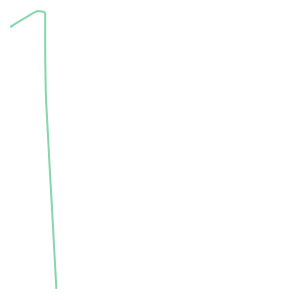

In [23]:
# Isolate one specific flight
flight = flights[9]
flight

In [24]:
handovers = airspacegraph.test_flight(flight)
handovers

INFO:flight_processing.data.airspace_graph:Getting all handovers along the flight.
INFO:flight_processing.data.airspace_graph:Converting flight to arrays of coordinates.
INFO:flight_processing.data.airspace_graph:Processing flight using AirspaceHandler C++ object.
INFO:flight_processing.data.airspace_graph:Computing confidence values for each handover.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence based on non-position-based data sources.
INFO:flight_processing.data.airspace_graph:Getting edge weights.
INFO:flight_processing.data.airspace_graph:Computing confidence bas

[{'distance1': None,
  'distance2': None,
  'confidence': 1.0,
  'weight': 966,
  'weight_adjusted': 0.011811023622047244,
  'confidence_distance': 0.0,
  'confidence_weight': 1.0,
  'confidence_weight_adjusted': 0.0,
  'airspace1': 457,
  'airspace2': 602,
  'name1': 'UPPER AIRSPACE CTA',
  'name2': 'SCOTTISH TMA 3'},
 {'distance1': None,
  'distance2': None,
  'confidence': 1.0,
  'weight': 966,
  'weight_adjusted': 0.011811023622047244,
  'confidence_distance': 0.0,
  'confidence_weight': 1.0,
  'confidence_weight_adjusted': 0.0,
  'airspace1': 458,
  'airspace2': 602,
  'name1': 'UPPER AIRSPACE CTA',
  'name2': 'SCOTTISH TMA 3'},
 {'distance1': None,
  'distance2': None,
  'confidence': 1.0,
  'weight': 966,
  'weight_adjusted': 0.011811023622047244,
  'confidence_distance': 0.0,
  'confidence_weight': 1.0,
  'confidence_weight_adjusted': 0.0,
  'airspace1': 459,
  'airspace2': 602,
  'name1': 'UPPER AIRSPACE CTA',
  'name2': 'SCOTTISH TMA 3'},
 {'distance1': None,
  'distance2': N

### Visualisation

We can plot this flight on a map along with the airspaces it intersected along the way.

In [25]:
regions = set()
for h in handovers:
    regions.add(int(h['airspace1']))
    regions.add(int(h['airspace2']))

regions

{457, 458, 459, 460, 461, 462, 463, 601, 602, 603}

INFO:flight_processing.data.airspace_graph:Downloading terrain data from Stamen.
INFO:flight_processing.data.airspace_graph:Plotting airspace boundaries on map.
INFO:flight_processing.data.airspace_graph:Extracting edge weights from graph.
INFO:flight_processing.data.airspace_graph:Plotting graph on map.
INFO:flight_processing.data.airspace_graph:Plotting flight(s) on map.
INFO:flight_processing.data.airspace_graph:Plotting subset of airspaces on map.


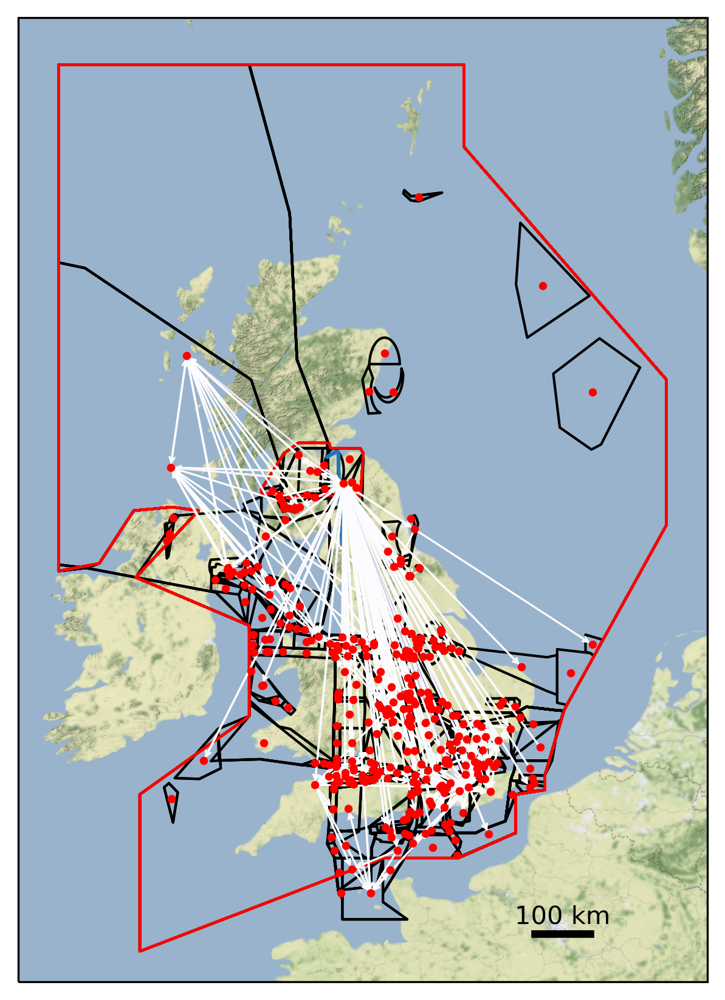

In [26]:
airspacegraph.draw_graph_map(flight=flight, subset=regions)

In [27]:
# Cleanup
del airspacegraph